In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import os

In [2]:
datasets=["youtube","dblp","amazon"] + ["lj"] * 8 + ["orkut"] * 3
dataset_min_nodes=[16,16,21] + list(range(51,131,10)) + [151,251,351]
dataset_max_nodes=[20,20,25] + list(range(55,135,10)) + [155,255,355]
sources=["node2vec","deepWalk"]
targets=["TransE","TransH", "TransD", "SimplE", "RESCAL", "DistMult"]
metrics = ['mean', 'iqr', 'cilo', 'cihi', 'whishi', 'whislo', 'q1', 'med', 'q3']
methods=['source','source2target','transformed','target']
labels=['source','finetuned','transformed','target']
colors = ['C2','C1','C3','C5']
measures = ["MRR", "MR", "Hit@10", "Hit@3", "Hit@1"]
dim=32
split='test'

In [3]:
plot_type = 'boxplot'
plot_path = os.path.join('../plots/', str(dim), plot_type)
df = pd.read_csv('../data/' + plot_type + '.csv')
if not os.path.exists(plot_path):
    os.makedirs(plot_path)

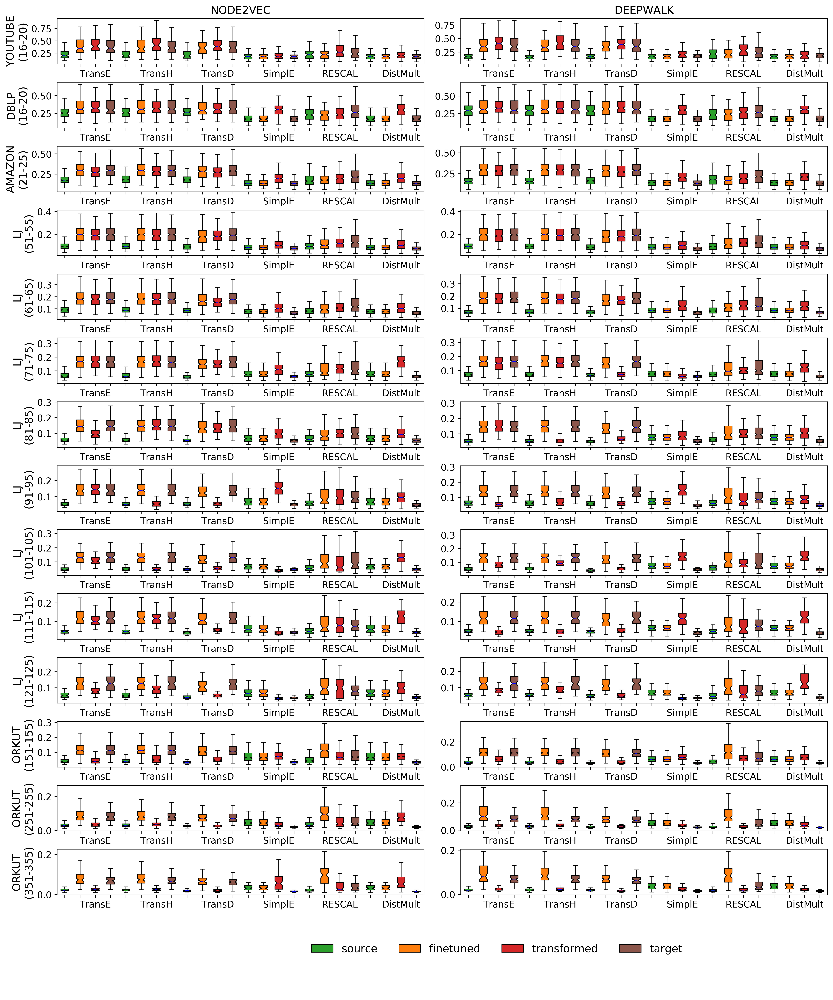

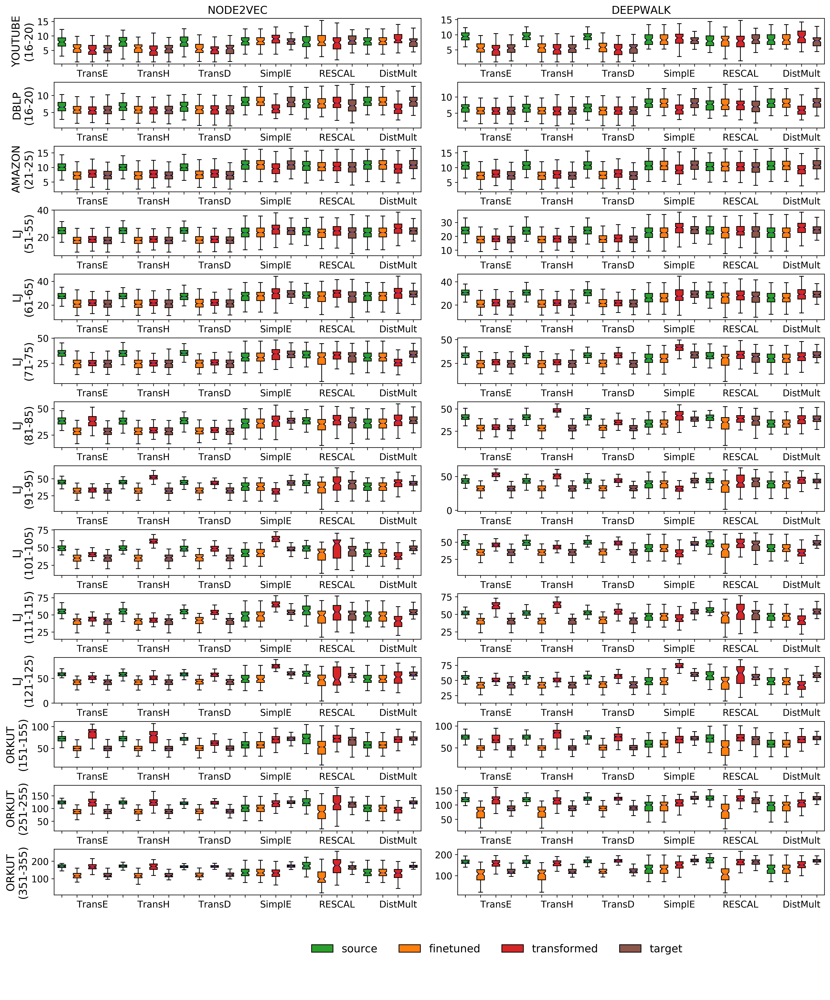

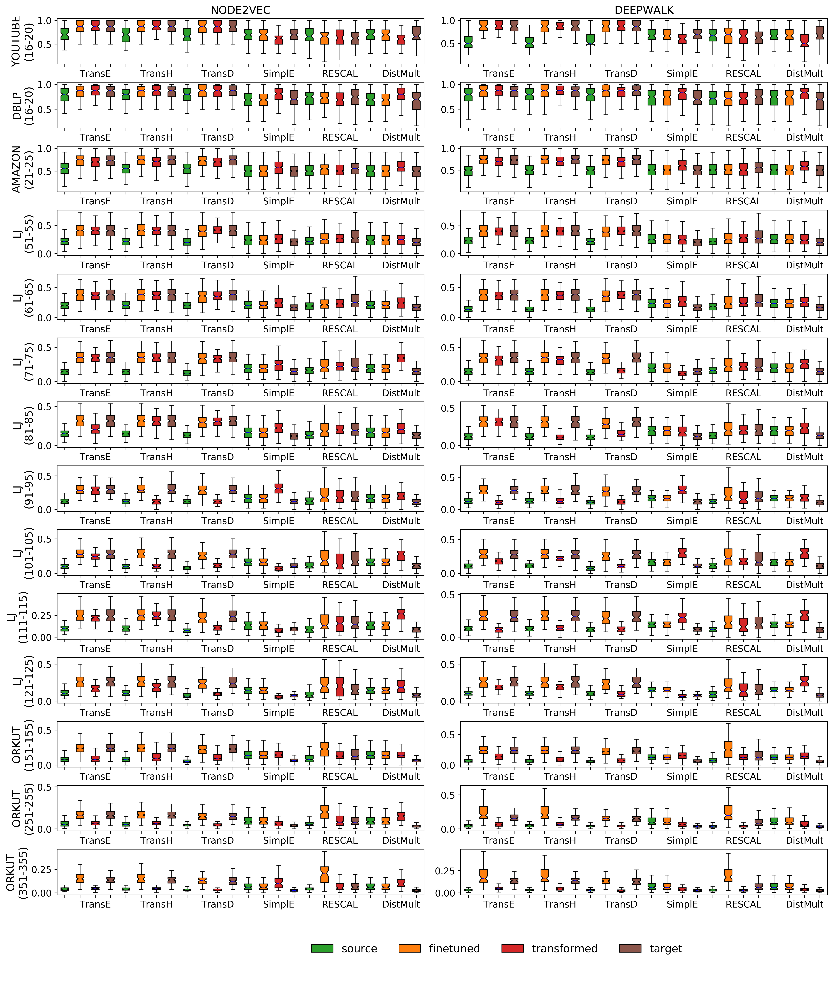

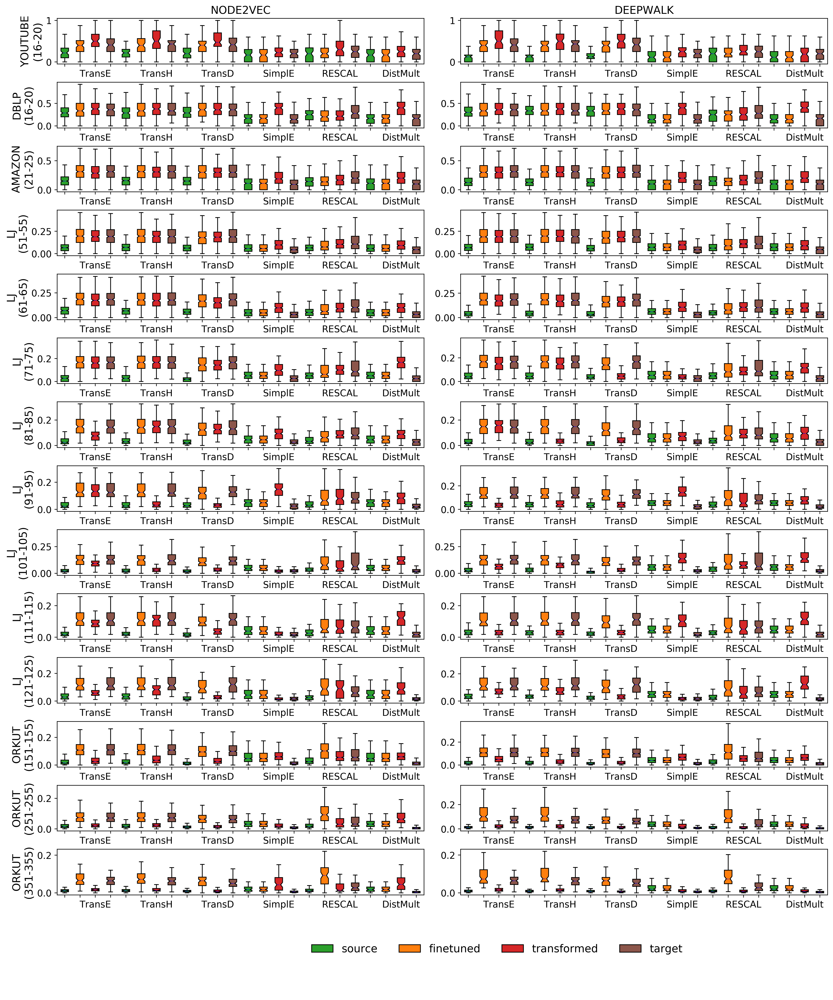

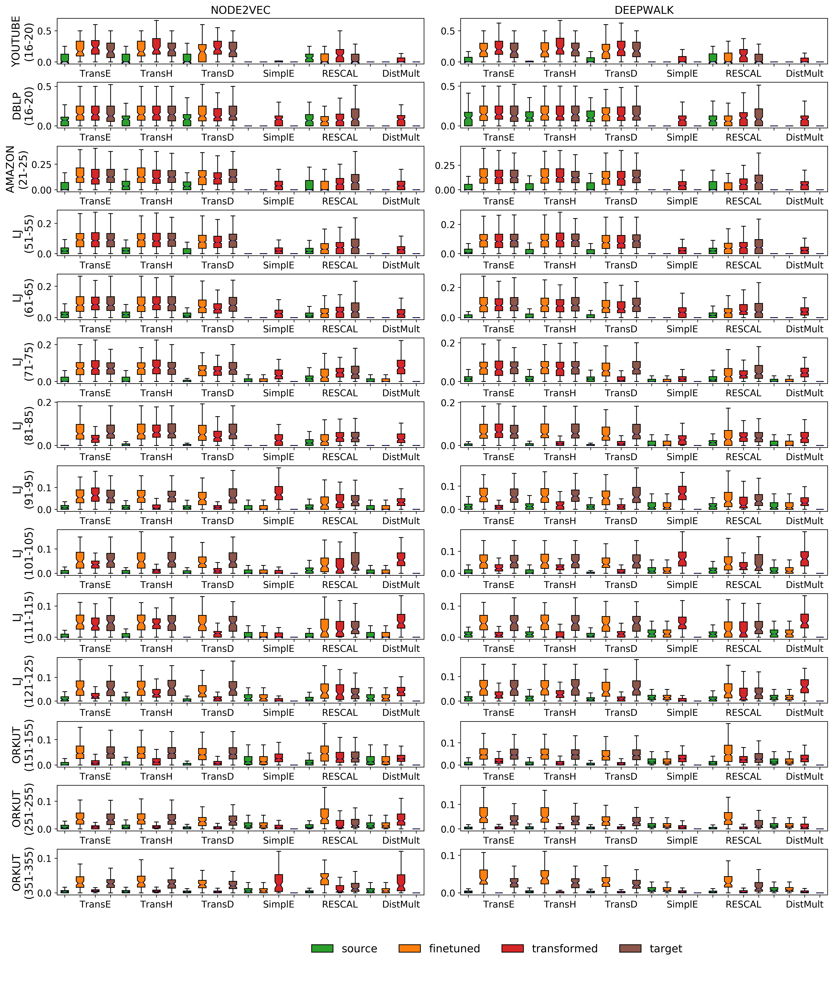

In [4]:
medianprops = dict(linestyle='-.', linewidth=0.5, color='blue')

for measure in measures:
    print('========================' + measure + '=======================')
    fig = plt.figure(figsize=(18, 21),dpi= 400, facecolor='w', edgecolor='k')
    i=1
    for j, dataset in enumerate(datasets):
        graph_size = str(dataset_min_nodes[j]) + '-' + str(dataset_max_nodes[j])
        for source in sources:
            ax = fig.add_subplot(len(datasets), len(sources),i)
            all_stats = []
            for target in targets:
                for method in methods:
                    filt = (df['DATASET'] == dataset) & \
                        (df['SIZE'] == graph_size) & \
                        (df['DIM'] == dim) & \
                        (df['SOURCE'] == source) & \
                        (df['TARGET'] == target) & \
                        (df['METHOD'] == method) & \
                        (df['MEASURE'] == measure) & \
                        (df['SPLIT'] == split)
                    row = df.loc[filt]
                    #print('{},{},{},{},{},{},{},{}'.format(dataset,graph_size,dim,source,target,method,measure,split))
    
                    stats = {'label': '', 'fliers':[]}
                    if method=='transformed':
                        stats['label'] = target
                    for metric in metrics:
                        stats[metric] = row[metric].item()
                    all_stats.append(stats)
            
            bp = ax.bxp(all_stats, shownotches=True,patch_artist=True,medianprops=medianprops)
            
            if i%2 == 1:
                ax.set_ylabel('{}\n({})'.format(dataset.upper(), graph_size),fontsize=14)
                
            if j == 0:
                ax.set_title(source.upper(),fontsize=14)
            
            for tick in ax.yaxis.get_major_ticks():
                tick.label.set_fontsize(12)
            
            for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(12)
            
            for k,box in enumerate(bp['boxes']):
                box.set(facecolor = colors[k%len(colors)]) 
            
            #ax.set_ylim(0,0.75)
            
            i+=1
    
    plt.subplots_adjust(hspace=0.4, wspace=0.1)
    #fig.suptitle(measure, fontsize=18)
    fig.legend(bp['boxes'][:4],labels,loc='lower center',borderpad=0,bbox_to_anchor= (0.5, 0.03), ncol=4, 
            borderaxespad=1, frameon=False, fontsize=14)
    fig.savefig(os.path.join(plot_path,measure + '.png'), bbox_inches='tight')
            